# Teste Elo7 - Data Science - Classes de intenção e Recomendação

O objetivo desse projeto é definir classes de intencao de compra dos clientes e fazer um programa capaz de recomendar produtos similares ao seu interesse.

## Analisando possíveis classes de intenção

A primeira abordagem é agrupar os dados por ID do produto e tentar entender algumas características/padrões no acesso aos produtos. A pergunta guia para esse caso é: 

<b>Os dados podem ser agrupados de maneira a entender o comportamento de acesso aos produtos e logo adiante traçar grupos personalizados de intenção dos usuários?</b>

De acordo com a análise exploratória dos dados realizada anteriormente, alguns aspectos interessantes para traçar um comportamento de acesso/compra dos produtos seriam:

<ul>
    <li> Criar uma variável de correlação entre a query utilizada pelo usuários e as tags de acesso ao produto </li>
    <li> Definir a proporção entre vendas e acesso</li>   
    <li> Analisar a faixa de preço dos produtos </li>
</ul>

A partir daí, os dados podem ser agrupados e os perfis de intenção podem ser criados...

Dito isso, os passos aqui serão:

<ul>
    <li>Criar atributos para segmentar os produtos</li>
    <li>Aplicar o algoritmo de clustering K-means</li>
    <li>Otimização dos hiperparâmetros (executar o K-means para vários Ks e escolher o melhor através do Algoritmo do Cotovelo)</li>
    <li>Executar o K-means com o K ótimo</li>
    <li>Rotular os grupos de dados</li>
    <li>Analisar as variáveis de cada grupo para traçar um perfil</li>
</ul>

## Importando...

In [1]:
import pandas as pd
import numpy as np
from scipy import interp
import math
import joblib
import plotly.express as px

from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import cohen_kappa_score
from sklearn.metrics.pairwise import cosine_similarity

from sklearn import preprocessing 
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split
from sklearn.svm import LinearSVC
from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns
#sns.set(font_scale=1.1)
#sns.set_style("whitegrid")

import warnings
warnings.filterwarnings('ignore')

## Limpeza dos dados

In [2]:
data = pd.read_csv("dataset/elo7_recruitment_dataset.csv")
data.shape

(38507, 15)

In [3]:
data['order_counts'] = data['order_counts'].fillna(0)
data['order_counts'] = data['order_counts'].astype('int64')

In [4]:
data.dropna(inplace=True)

In [5]:
data.isnull().sum()

product_id           0
seller_id            0
query                0
search_page          0
position             0
title                0
concatenated_tags    0
creation_date        0
price                0
weight               0
express_delivery     0
minimum_quantity     0
view_counts          0
order_counts         0
category             0
dtype: int64

## Criando as novas variáveis

Serão definidas as variáveis: <b>cosine_sim_tag</b> e <b>conversion_ratio</b>

#### <hr style="height:0.5px;border-width:0;color:black;background-color:black">Filtro dos atributos que serão utilizados

In [6]:
new_data = data[['product_id','title','query','concatenated_tags','price', 'view_counts', 'order_counts']]
new_data

,product_id,title,query,concatenated_tags,price,view_counts,order_counts
0,11394449,Mandala Espírito Santo,espirito santo,mandala mdf,171.890000,244,0
1,15534262,Cartão de Visita,cartao de visita,cartao visita panfletos tag adesivos copos lon...,77.670000,124,0
2,16153119,Organizador expositor p/ 70 esmaltes,expositor de esmaltes,expositor,73.920006,59,0
3,15877252,Jogo de Lençol Berço Estampado,medidas lencol para berco americano,t jogo lencol menino lencol berco,118.770004,180,1
4,15917108,ADESIVO BOX DE BANHEIRO,adesivo box banheiro,adesivo box banheiro,191.810000,34,0
...,...,...,...,...,...,...,...
38502,16561714,Imagem Nossa Senhora Aparecida em Perolas 25cm,nossa senhora de perolas,senhora aparecida bebe perolas,71.200000,315,15
38503,12716324,LEMBRANCINHA - DIA DOS PAIS,lembrancinha personalizada dia dos pais,lembrancinhas,14.650000,1288,17
38504,972256,Copos Metalizados - Rosé,copo metalizado,despedida bianca metalizados xvdakaw lembranci...,11.580000,306,0
38505,7291315,Kit Festa do Pijama Meninos,festa do pijama menino,festa pijama,131.330000,55,0


 
#### <hr style="height:0.5px;border-width:0;color:black;background-color:black">Definindo 'cosine_sim_tag'

Abrindo arquivo com as stop words e tratando-as

In [7]:
with open("docs/stopwords.txt", encoding='utf-8') as file: 
    stop_words = file.read()

In [8]:
x = stop_words.split('\n')
remove_space = lambda x: x.strip()
stopwords = list(map(remove_space, x))

Criando o vetorizador com TD-IDF a partir das <b>queries</b> e das <b>tags</b> <a id='tfidf'></a>

In [9]:
vectorizer = TfidfVectorizer(stop_words = stopwords)
vectorizer.fit(new_data['query'] + ' ' + new_data['concatenated_tags'])
#joblib.dump(vectorizer,"models/TFIDF_elo7data2.pkl") # comando para salvar o modelo num .pkl

TfidfVectorizer(stop_words=['de', 'a', 'o', 'que', 'e', 'do', 'da', 'em', 'um',
                            'para', 'é', 'com', 'não', 'uma', 'os', 'no', 'se',
                            'na', 'por', 'mais', 'as', 'dos', 'como', 'mas',
                            'foi', 'ao', 'ele', 'das', 'tem', 'à', ...])

Vetorizando os atributos do dataframe <b> query</b> e <b>concatenated_tags</b>

In [10]:
query = vectorizer.transform(new_data['query']).toarray()
tag   = vectorizer.transform(new_data['concatenated_tags']).toarray()

Calculando a similaridade de cossenos entre os vetores de <b>query</b> e <b>concatenated_tags</b> de cada produto

In [11]:
cosine_sim = np.zeros(len(query))
for i in range(len(query)):
    cosine_sim[i] = cosine_similarity([query[i]],[tag[i]])[0][0]

Criando uma nova coluna do dataframe para armazenar a similaridade de cossenos

In [12]:
cosine_sim = cosine_sim.reshape(-1,1)
new_data['cosine_sim_tag'] = cosine_sim
new_data

,product_id,title,query,concatenated_tags,price,view_counts,order_counts,cosine_sim_tag
0,11394449,Mandala Espírito Santo,espirito santo,mandala mdf,171.890000,244,0,0.000000
1,15534262,Cartão de Visita,cartao de visita,cartao visita panfletos tag adesivos copos lon...,77.670000,124,0,0.494877
2,16153119,Organizador expositor p/ 70 esmaltes,expositor de esmaltes,expositor,73.920006,59,0,0.674649
3,15877252,Jogo de Lençol Berço Estampado,medidas lencol para berco americano,t jogo lencol menino lencol berco,118.770004,180,1,0.583850
4,15917108,ADESIVO BOX DE BANHEIRO,adesivo box banheiro,adesivo box banheiro,191.810000,34,0,1.000000
...,...,...,...,...,...,...,...,...
38502,16561714,Imagem Nossa Senhora Aparecida em Perolas 25cm,nossa senhora de perolas,senhora aparecida bebe perolas,71.200000,315,15,0.775222
38503,12716324,LEMBRANCINHA - DIA DOS PAIS,lembrancinha personalizada dia dos pais,lembrancinhas,14.650000,1288,17,0.000000
38504,972256,Copos Metalizados - Rosé,copo metalizado,despedida bianca metalizados xvdakaw lembranci...,11.580000,306,0,0.000000
38505,7291315,Kit Festa do Pijama Meninos,festa do pijama menino,festa pijama,131.330000,55,0,0.843641


In [13]:
new_data[new_data['product_id'] == 12716324]

,product_id,title,query,concatenated_tags,price,view_counts,order_counts,cosine_sim_tag
7954,12716324,LEMBRANCINHA - DIA DOS PAIS,presente dia dos pais para empresas,lembrancinhas,15.49,1227,10,0.00000
10142,12716324,LEMBRANCINHA - DIA DOS PAIS,lembrancinhas para os pais,lembrancinhas,13.86,1229,22,0.62571
14887,12716324,LEMBRANCINHA - DIA DOS PAIS,lembrancinha para o dia dos pais empresa,lembrancinhas,4.99,1226,10,0.00000
16269,12716324,LEMBRANCINHA - DIA DOS PAIS,presente barato para o dia dos pais,lembrancinhas,14.08,1249,10,0.00000
17489,12716324,LEMBRANCINHA - DIA DOS PAIS,tema dia dos pais,lembrancinhas,14.13,1204,23,0.00000
21062,12716324,LEMBRANCINHA - DIA DOS PAIS,dia dos pais,lembrancinhas,15.90,1232,18,0.00000
23351,12716324,LEMBRANCINHA - DIA DOS PAIS,lembrancinha pais,lembrancinhas,15.11,1204,29,0.00000
23715,12716324,LEMBRANCINHA - DIA DOS PAIS,lembrancinha dia dos pais,lembrancinhas,15.48,1228,10,0.00000
26024,12716324,LEMBRANCINHA - DIA DOS PAIS,lembrancinha personalizada dia dos pais,lembrancinhas,4.99,1204,22,0.00000
37930,12716324,LEMBRANCINHA - DIA DOS PAIS,lembrancinha para o dia dos pais,lembrancinhas,14.57,1221,10,0.00000


#### <hr style="height:0.5px;border-width:0;color:black;background-color:black">Definindo 'conversion_ratio'


Esse atributo será definido pela razão <b>order_counts</b> $\div$  <b>view_counts</b>

In [14]:
#agrupa por produto, calculando a média de todas as colunas
product_info = new_data.groupby(["product_id"]).agg("mean").reset_index() 
product_info

,product_id,price,view_counts,order_counts,cosine_sim_tag
0,361,10.42000,190.0,28.0,0.449524
1,1426,25.52000,3294.0,0.0,0.277031
2,2102,10.95000,113.0,0.0,0.638722
3,2295,11.61000,76.0,0.0,0.390462
4,3528,9.05000,1444.0,6.0,0.428593
...,...,...,...,...,...
29743,16689822,35.34000,913.0,0.0,0.000000
29744,16690454,200.48000,275.0,4.0,0.109476
29745,16691829,11.35000,129.0,0.0,0.782559
29746,16692023,2.00000,53.0,0.0,0.559359


Quantos produtos tem similaridade de cosseno igual a 0?

In [15]:
product_info[product_info['cosine_sim_tag'] == 0].shape[0]

8432

Quantos produtos não tiveram vendas?

In [16]:
product_info[product_info['order_counts'] == 0].shape[0]

15800

O novo atributo <b> converstion_ratio </b> recebe <b>order_counts</b> $\div$  <b>view_counts</b>

In [17]:
product_info['conversion_ratio'] = product_info['order_counts']/product_info['view_counts'] * 100

In [18]:
product_info.describe()

,product_id,price,view_counts,order_counts,cosine_sim_tag,conversion_ratio
count,2.974800e+04,29748.000000,29748.000000,29748.000000,29748.000000,29748.000000
mean,8.349960e+06,87.358919,404.952515,10.369262,0.382813,3.557971
std,4.829827e+06,216.599940,991.605267,33.488629,0.320874,9.271452
min,3.610000e+02,0.070000,1.000000,0.000000,0.000000,0.000000
25%,4.145897e+06,13.040000,101.000000,0.000000,0.000000,0.000000
50%,8.373072e+06,32.495000,200.000000,0.000000,0.376330,0.000000
75%,1.253165e+07,94.332500,405.000000,13.000000,0.640410,4.586279
max,1.669295e+07,11509.380000,45010.000000,2460.000000,1.000000,550.000000


## Visualização 

Como está a distribuição dos atributos que serão utilizados no agrupamento?

OBS: devido a grande variação dos dados e diferentes ordens de grandeza dos atributos, foi aplicado a escala logarítmica.

[]

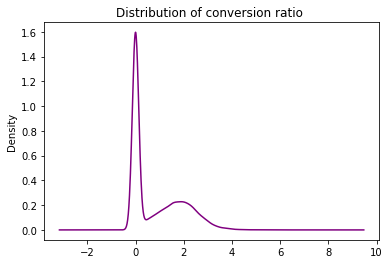

In [19]:
np.log1p(product_info['conversion_ratio']).plot.kde(color='purple')
plt.title("Distribution of conversion ratio ")
plt.plot()

15800 produtos não tiveram vendas, por isso a taxa de conversão tem um pico em 0.

[]

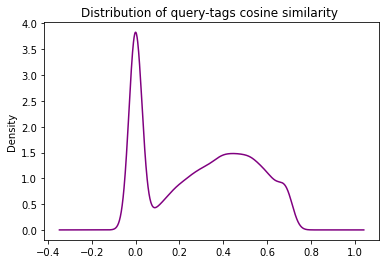

In [20]:
np.log1p(product_info['cosine_sim_tag']).plot.kde(color='purple')
plt.title("Distribution of query-tags cosine similarity ")
plt.plot()

Com a similaridade ocorre a mesma coisa, há um pico no 0, o que quer dizer que a maioria dos produtos dos registros foram acessados a partir de queries e tags pouco relacionadas

[]

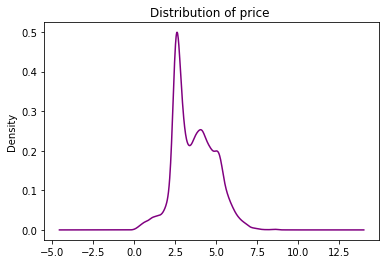

In [21]:
np.log1p(product_info['price']).plot.kde(color='purple')
plt.title("Distribution of price ")
plt.plot()

## Clustering

Nesse passo, os dados serão agrupados utilizando as variáveis <b>price</b>, <b>cosine_sim_tag</b> e <b>conversion_ratio</b>.

O primeiro passo é definir o <b>hiperparâmetro</b>. Para isso é aplicado o Método do Cotovelo, onde o algoritmo K-means é executado num intervalo de números de K. Dessa forma um gráfico dos valores da função de otimização é traçado contra o número de clusters. O número ótimo de K é dado como o ponto da curva a partir da onde a convergência é mais lenta. De uma maneira mais direta: é o valor do ponto que tem possui maior distância da reta traçada do primeiro ponto até o último ponto da curva.

#### <hr style="height:0.5px;border-width:0;color:black;background-color:black">Hiperparâmetros (definindo K)

-------------------------------------------- Funções -------------------------------------------------

In [22]:
# Executar Kmeans para 1-10 clusters e armazenar o valor da distância Euclidiana intracluster (inertia values)
def K_list(K, dataframe):
    cluster_values = list(range(1, K+1))
    inertia_values=[]
    
    for c in cluster_values:
        model = KMeans(n_clusters = c, init='k-means++', max_iter=500, random_state=40)
        model.fit(dataframe)
        inertia_values.append(model.inertia_)
    
    return inertia_values

# Achar o K ótimo (cotovelo) na curva traçada
def cotovelo(pontos):
    p1 = np.empty([2])
    p2 = np.empty([2])
    p3 = np.empty([2])
    
    p1 = [1,pontos[0]]
    p2 = [len(pontos), pontos[len(pontos)-1]]
    
    dist = 0
    eps = 0
    div = 0
    
    for i in range(0,len(pontos)):
        p3[0] = i
        p3[1] = pontos[i]
        
        d = (p2[1] - p1[1]) * p3[0]
        d = d - ((p2[0] - p1[0]) * p3[1])
        d = d + (p2[0] * p1[1])
        d = d - (p2[1] * p1[0])
        d = abs(d)
        
        div = (p2[1] - p1[1]) ** 2 
        div = div + (p2[0] - p1[0]) ** 2
        
        div = math.sqrt(div)
        
        d = d/div
        
        if (d>= dist):
            dist = d
            eps = p3[1]
            Kopt = i+2
    
    
    return Kopt

Normalização dos dados com aplicação de $log_e$

In [23]:
product_info['price_log'] = np.log1p(product_info['price'])
product_info['cosine_sim_tag_log'] =  np.log1p(product_info['cosine_sim_tag'])
product_info['conversion_ratio_log'] =  np.log1p(product_info['conversion_ratio'])

In [24]:
product_info

,product_id,price,view_counts,order_counts,cosine_sim_tag,conversion_ratio,price_log,cosine_sim_tag_log,conversion_ratio_log
0,361,10.42000,190.0,28.0,0.449524,14.736842,2.435366,0.371235,2.756005
1,1426,25.52000,3294.0,0.0,0.277031,0.000000,3.277899,0.244537,0.000000
2,2102,10.95000,113.0,0.0,0.638722,0.000000,2.480731,0.493916,0.000000
3,2295,11.61000,76.0,0.0,0.390462,0.000000,2.534490,0.329636,0.000000
4,3528,9.05000,1444.0,6.0,0.428593,0.415512,2.307573,0.356690,0.347492
...,...,...,...,...,...,...,...,...,...
29743,16689822,35.34000,913.0,0.0,0.000000,0.000000,3.592919,0.000000,0.000000
29744,16690454,200.48000,275.0,4.0,0.109476,1.454545,5.305690,0.103887,0.897942
29745,16691829,11.35000,129.0,0.0,0.782559,0.000000,2.513656,0.578050,0.000000
29746,16692023,2.00000,53.0,0.0,0.559359,0.000000,1.098612,0.444275,0.000000


Executando o Kmeans para vários valores de K (1-10) 

In [25]:
data_cluster = product_info[['price_log', 'cosine_sim_tag_log', 'conversion_ratio_log']]
K_list_values = K_list(10, data_cluster)

Plotando os valores de soma das distâncias quadradas intracluster pelo intervalo de K

In [26]:
K_list_frame = pd.DataFrame({'Inertia':K_list_values, 'Number_K': range(1,11)})

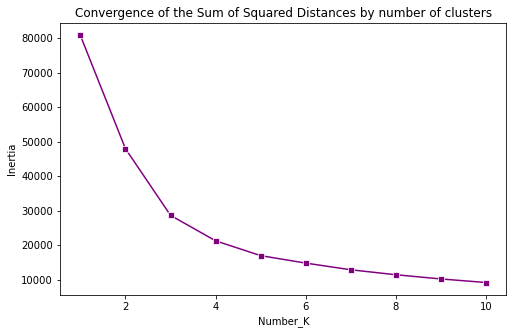

In [27]:
plt.figure(figsize=(8,5))
sns.lineplot(data=K_list_frame, x="Number_K", y="Inertia", marker='s', color='purple')
plt.title('Convergence of the Sum of Squared Distances by number of clusters')
plt.show()

Qual o melhor número de clusters?

In [28]:
K_best = cotovelo(K_list_frame['Inertia'].to_numpy())
print(f'Número ótimo de clusters (cotovelo): {K_best}')

Número ótimo de clusters (cotovelo): 4


#### <hr style="height:0.5px;border-width:0;color:black;background-color:black">Aplicando o Kmeans (K=4)

In [29]:
model = KMeans(n_clusters = K_best, init='k-means++', max_iter=500, random_state=40)
model.fit_predict(data_cluster)

array([0, 2, 2, ..., 2, 2, 1])

In [30]:
product_info["clusters"] = model.labels_

#### <hr style="height:0.5px;border-width:0;color:black;background-color:black">Visualização dos clusters <a id='scatter'></a>

In [31]:
fig = px.scatter_3d(product_info,
                    x="price_log",
                    y="cosine_sim_tag_log",
                    z="conversion_ratio_log",
                    color='clusters',
                    hover_data=["price",
                                "cosine_sim_tag",
                                "conversion_ratio"],
                    )

fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))
fig.show()

Analisando graficamente, a divisão de grupos parece bem consistente. A variação de dados no eixo de <b>cosine_sim_tag </b> não foi capturada pelo agrupamento. A falta de influência da variável é percebida na representação gráfica e isso se deve à sua ordem de grandeza, que é menor comparada às outras duas. Seus valores variam, aproximadamente de 0 a 0.8, enquanto as outras variam de 0-8. No cálculo da distância Euclidiana no K-means isso faz diferença.

#### <hr style="height:0.5px;border-width:0;color:black;background-color:black">Distribuição dos dados nos clusters

In [32]:
product_info.clusters.value_counts()

2    11242
1     7412
3     5869
0     5225
Name: clusters, dtype: int64

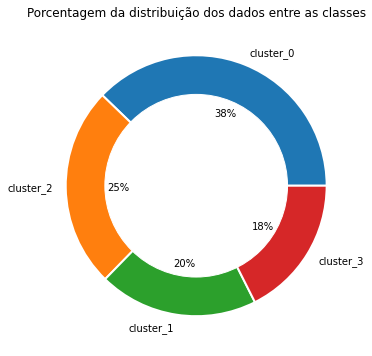

In [33]:
plt.figure(figsize=(12,6))
plt.pie(product_info.clusters.value_counts(),
labels=['cluster_0','cluster_2','cluster_1','cluster_3'], autopct="%1.0f%%",
        wedgeprops={"linewidth":2,"edgecolor":"white"})
plt.gca().add_artist(plt.Circle((0,0),.7,color = "white"))


plt.title("Porcentagem da distribuição dos dados entre as classes")
plt.show()

#### <hr style="height:0.5px;border-width:0;color:black;background-color:black"> Estatísticas: média, valor mínimo e máximo por cluster

--------------------------- Média -----------------------------<a id='mean'></a>

In [34]:
mean = product_info.groupby(["clusters"]).agg("mean").reset_index() 
mean

,clusters,product_id,price,view_counts,order_counts,cosine_sim_tag,conversion_ratio,price_log,cosine_sim_tag_log,conversion_ratio_log
0,0,8.355610e+06,16.145227,418.809527,26.765981,0.377890,10.137414,2.680040,0.293663,2.144937
1,1,8.389677e+06,216.707785,396.739788,2.235934,0.384390,0.260488,4.962160,0.297908,0.163504
2,2,8.337470e+06,16.932950,379.041432,0.848527,0.389008,0.118178,2.711967,0.300904,0.075870
3,3,8.318695e+06,122.302942,452.620303,24.280231,0.373337,8.453779,4.574844,0.291331,2.006268


Os <b>preços médios</b> de cada classe de intenção serão salvos num documento para ser usado como atributo no <b>sistema híbrido</b>, pois o sistema de classificação em categorias de produtos necessita do <b>preço</b> como atributo de entrada.

In [35]:
list_mean_price = list(map(lambda x: str(x), mean['price'].to_numpy()))
mean_price = ''
for price in list_mean_price:
    mean_price = mean_price + ' ' + price

In [36]:
with open('docs/mean_price.txt', mode='w+') as f:
    f.write(mean_price.strip())

---------------------- Valor máximos ------------------------<a id='max'></a>

In [37]:
product_info.groupby(["clusters"]).agg("max").reset_index() 

,clusters,product_id,price,view_counts,order_counts,cosine_sim_tag,conversion_ratio,price_log,cosine_sim_tag_log,conversion_ratio_log
0,0,16689440,46.850002,23571.0,1036.0,1.0,550.000000,3.868071,0.693147,6.311735
1,1,16692953,11509.380000,41534.0,644.4,1.0,3.478261,9.351005,0.693147,1.499235
2,2,16692023,45.590000,45010.0,178.5,1.0,2.065491,3.841386,0.693147,1.120208
3,3,16685935,5563.860000,34000.6,2460.0,1.0,400.000000,8.624227,0.693147,5.993961


---------------------- Valor mínimo ------------------------<a id='min'></a>

In [38]:
product_info.groupby(["clusters"]).agg("min").reset_index() 

,clusters,product_id,price,view_counts,order_counts,cosine_sim_tag,conversion_ratio,price_log,cosine_sim_tag_log,conversion_ratio_log
0,0,361,0.09,2.0,1.0,0.0,1.984822,0.086178,0.0,1.093540
1,1,4607,44.09,1.0,0.0,0.0,0.000000,3.808660,0.0,0.000000
2,2,1426,0.07,1.0,0.0,0.0,0.000000,0.067659,0.0,0.000000
3,3,7261,34.52,2.0,1.0,0.0,1.483051,3.570096,0.0,0.909488


###  Considerações

Os clusters estabelecidos estão relativamente bem distribuídos: 
<ul> 
    <li>Cluster 0: 38%</li>
    <li>Cluster 1: 20%</li>
    <li>Cluster 2: 25%</li>
    <li>Cluster 3: 18%</li>
</ul>

Analisando a [média](#mean)  das variáveis para cada cluster é possível notar que a similaridade de cossenos entre a query de busca e as tags do produto (<b>cosine_sim_tag_log</b>) possui valores similares, em torno de 0,38. Portanto não há informações relevantes quanto a esse atributo. Esperava-se que uma similaridade menor indicasse, de certa forma, uma taxa de conversão menor, visto que as tags do produto muito provavelmente não estariam alinhadas ao interesse do cliente. Em termos de análise de dispersão dos dados ([ver gráfico](#scatter)), é notável que a topologia apresentada permitiria diversas divisões, como a ordem de grandeza de <b>cosine_sim_tag_log</b> é menor comparada com os valores de <b>price_log</b> e <b>conversion_ratio_log</b>, essas últimas tiveram uma influência maior na divisão dos grupos.


Considerando as informações obtidas das outras variáveis:

<ul>
    <li> Cluster 0: os produtos possuem média de preço de R\$16,14,  valor máximo de R\$46,5 e mínimo de R\$0,09. A taxa de conversão é de aproximadamente 10,13%. Ainda, é o grupo com maior número de dados. </li>
    <li> Cluster 1:os produtos possuem  média de preço de R\$216,70,  valor máximo de R\$11509,38 e mínimo de R\$44,09. A taxa de conversão é de aproximadamente 0.26%. </li>
    <li> Cluster 2:os produtos possuem média de preço de R\$16,93,  valor máximo de R\$11509,38 e mínimo de R\$44,09. A taxa de conversão é de aproximadamente 0,11%. </li>
    <li> Cluster 3:os produtos possuem média de preço de R\$216,70,  valor máximo de R\$45,59 e mínimo de R\$0,07. A taxa de conversão é de aproximadamente 8,45%. </li>
</ul>

Com base no que foi observado, as <b>classes de intenção</b> do usuário serão as seguintes:

<ul>
    <li> <b>Cluster 0</b>: produtos indicados para clientes que procuram algo barato e popular. </li>
    <li> <b>Cluster 1</b>: produtos indicados para clientes que procuram artigos mais sofisticados, preços maiores e com pouca conversão </li>
    <li> <b>Cluster 2</b>: produtos indicados para clientes que procuram presentes ou artigos "fora da curva", baratos, porém pouco populares - devido sua taxa de conversão baixa. </li>
    <li> <b>Cluster 3</b>: produtos indicados para clientes que procuram artigos mais caros e populares.
        
    

## Classificação

Nessa seção será feita a classicação dos dados nas <b>classes de intenção</b> definidas a partir da query de entrada do usuários.

#### <hr style="height:0.5px;border-width:0;color:black;background-color:black">Definindo funções...

In [39]:
# Function to plot confusion matrix. 
# Ref:http://scikit-learn.org/stable/auto_examples/model_selection/plot_confusion_matrix.html
import itertools

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label',fontsize=15)
    plt.xlabel('Predicted label',fontsize=15)

In [40]:
def metrics(y_true, y_pred, proba):
    result = np.random.randn(6)
    result[0] = accuracy_score(y_true,y_pred)
    result[1] = precision_score(y_true,y_pred,average='macro')
    result[2] = recall_score(y_true,y_pred,average='macro')
    result[3] = f1_score(y_true,y_pred,average='macro')
    result[4] = cohen_kappa_score(y_true,y_pred)
    lb = preprocessing.LabelBinarizer()
    lb.fit(y_true)
    y_true = lb.transform(y_true)
    result[5] = roc_auc_score(y_true,proba, average='macro')
    return result

def print_metrics(metrics):
    print("Acurácia:              ", metrics[0])
    print("Precisão:              ", metrics[1])
    print("Revocação:             ", metrics[2])
    print("F1-score:              ", metrics[3])
    print("Cohen Kappa score:     ", metrics[4])
    print("ROC AUC score:         ", metrics[5])

#### <hr style="height:0.5px;border-width:0;color:black;background-color:black"> Rotulando os dados originais 

Todo o processo foi feito considerando cada produto unicamente (sem repetição) jutamente com a média de seus atributos. Portanto agora, no dataset original, será feita a rotulagem.

In [41]:
product_info

,product_id,price,view_counts,order_counts,cosine_sim_tag,conversion_ratio,price_log,cosine_sim_tag_log,conversion_ratio_log,clusters
0,361,10.42000,190.0,28.0,0.449524,14.736842,2.435366,0.371235,2.756005,0
1,1426,25.52000,3294.0,0.0,0.277031,0.000000,3.277899,0.244537,0.000000,2
2,2102,10.95000,113.0,0.0,0.638722,0.000000,2.480731,0.493916,0.000000,2
3,2295,11.61000,76.0,0.0,0.390462,0.000000,2.534490,0.329636,0.000000,2
4,3528,9.05000,1444.0,6.0,0.428593,0.415512,2.307573,0.356690,0.347492,2
...,...,...,...,...,...,...,...,...,...,...
29743,16689822,35.34000,913.0,0.0,0.000000,0.000000,3.592919,0.000000,0.000000,2
29744,16690454,200.48000,275.0,4.0,0.109476,1.454545,5.305690,0.103887,0.897942,1
29745,16691829,11.35000,129.0,0.0,0.782559,0.000000,2.513656,0.578050,0.000000,2
29746,16692023,2.00000,53.0,0.0,0.559359,0.000000,1.098612,0.444275,0.000000,2


In [42]:
# nova coluna iniciando com 0s
new_data['clusters'] = 0

In [43]:
# Rotulandos os respectivos produtos do cluster 1
list_prod = product_info.loc[product_info['clusters']==1, ['product_id']].to_numpy().reshape(1,-1)[0]
new_data.loc[new_data['product_id'].isin(list_prod), ['clusters']] = 1

In [44]:
# Rotulandos os respectivos produtos do cluster 2
list_prod = product_info.loc[product_info['clusters']==2, ['product_id']].to_numpy().reshape(1,-1)[0]
new_data.loc[new_data['product_id'].isin(list_prod), ['clusters']] = 2

In [45]:
# Rotulandos os respectivos produtos do cluster 3
list_prod = product_info.loc[product_info['clusters']==3, ['product_id']].to_numpy().reshape(1,-1)[0]
new_data.loc[new_data['product_id'].isin(list_prod), ['clusters']] = 3

#### <hr style="height:0.5px;border-width:0;color:black;background-color:black">Divisão do conjunto para treino e teste

In [46]:
X = new_data['query']
y = new_data['clusters']

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=1)

print(X.shape, y.shape)
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(38447,) (38447,)
(28835,) (28835,)
(9612,) (9612,)


In [47]:
X_train_dtm = vectorizer.transform(X_train).toarray()
X_test_dtm = vectorizer.transform(X_test).toarray()

#### <hr style="height:0.5px;border-width:0;color:black;background-color:black"> Treinamento (SVM)<a id='svm'></a>

In [48]:
classifier = LinearSVC(class_weight='balanced') 
%time classifier.fit(X_train_dtm, y_train) 
y_pred_class = classifier.predict(X_test_dtm)
y_score = classifier.fit(X_train_dtm, y_train).decision_function(X_test_dtm)
#joblib.dump(classifier,"models/SVM_elo7data2.pkl") # comando para salvar o modelo num .pkl

Wall time: 8.26 s


In [49]:
print('*'*15, 'Report metrics','*'*25)
print_metrics(metrics(y_test, y_pred_class, y_score))
print('*'*55)

*************** Report metrics *************************
Acurácia:               0.550561797752809
Precisão:               0.511528911505224
Revocação:              0.5088503245986539
F1-score:               0.5083396207473945
Cohen Kappa score:      0.37011764968576755
ROC AUC score:          0.7969865687687413
*******************************************************


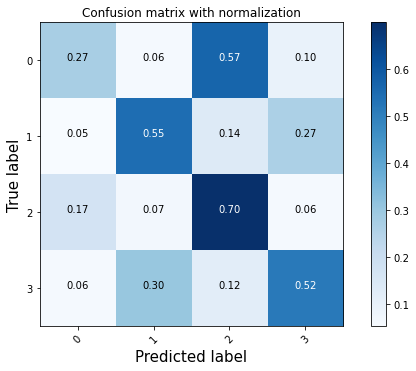

In [50]:
cnf_matrix = confusion_matrix(y_test, y_pred_class)
plt.figure(figsize=(8,5))
plot_confusion_matrix(cnf_matrix, classes=["0","1",'2',
                       '3'],normalize=True,
                      title='Confusion matrix with normalization')

Na primeira classe de intenção 0 o algoritmo teve performance insatifatória. 27% das amostras estão certas e 57% foi atribuída à classe 2. 

Nas outras classes o acerto foi mediano, na 2 ainda houve 70% de acurácia.



## Sistema de recomendação

A ideia do sistema  de recomendação é indicar ao cliente aqueles produtos similares na categoria de "intenção do usuário". Portanto, os dados dos produtos serão filtrados pela classe de intenção do usuários e logo após, será criada uma nova coluna no dataframe indicando a semelhanças de cossenos entre o vetor da <b> query de entrada </b> e os vetores da combinação <b>query+tag</b> dos produtos. Os dez produtos com maior similaridade serão recomendados ao cliente.

#### <hr style="height:0.5px;border-width:0;color:black;background-color:black"> Criando novo dataframe com os atributos necessários

In [51]:
products_rec = new_data[['product_id', 'title', 'clusters','price']]

In [52]:
# nova coluna que agrega a query e as tags do produto
products_rec['query_tags'] = data['query'] + ' ' + data['concatenated_tags'] 

In [53]:
products_rec.to_csv('dataset/elo7data_intent_labels.csv',index = False) 

#### <hr style="height:0.5px;border-width:0;color:black;background-color:black"> Aplicando para query "Lembrancinha do dia dos pais"

Qual é a query de entrada do usuário?

In [54]:
entry_query = ['lembrancinhas do dia dos pais'] 

Vetorizando com TD-IDF definido [aqui](#tfidf)

In [55]:
entry_query_vec  = vectorizer.transform(entry_query)
doc_vec = vectorizer.transform(products_rec['query_tags'])  

Calculando a similaridade de cossenos e armazenando numa nova coluna do dataframe <b> cossim </b>

In [56]:
cossim = [cosine_similarity([vec], entry_query_vec) for vec in doc_vec.toarray()]
cossim = list(map(lambda x: x[0][0], cossim))
products_rec['cossim'] = cossim

Qual é a classe de intenção? Aplicando o classificador SVM ([ver](#svm))

In [57]:
intention_class = classifier.predict(entry_query_vec)
# filtrando os produtos da classe
products_rec = products_rec[products_rec['clusters']==intention_class[0]] 

--------------------------------------- 10 produtos recomendados -------------------------------------------------

In [58]:
products_rec.sort_values(by=['cossim'],ascending=False).head(10)

,product_id,title,clusters,price,query_tags,cossim
21062,12716324,LEMBRANCINHA - DIA DOS PAIS,2,15.900000,dia dos pais lembrancinhas,1.000000
21622,5023460,Lembrança Dia dos Pais - Lembrancinha Dia dos ...,2,18.990000,lembrancinhas dia dos pais dia pais,0.970602
38182,6596002,Lembrança Dia dos Pais - Lembrancinha Dia dos ...,2,19.040000,lembrancinhas dia dos pais dia pais,0.970602
8525,8577839,Lembrancinha Mini Porta Retrato pai show MDF s...,2,1.800000,lembrancinhas dia dos pais quadros lembrancinh...,0.927893
3047,6268808,KIT DIA DOS PAIS,2,29.070000,kit dia dos pais lembrancinhas dia pais,0.914987
11693,15502775,Caixinha de Ferramentas Dia dos Pais em Eva,2,22.590000,lembrancinhas dia dos pais em eva lembrancinha...,0.914854
23715,12716324,LEMBRANCINHA - DIA DOS PAIS,2,15.480000,lembrancinha dia dos pais lembrancinhas,0.894937
37281,3157141,Lembrancinha Dia dos Pais,2,20.609999,lembrancinha dia dos pais lembrancinhas,0.894937
37930,12716324,LEMBRANCINHA - DIA DOS PAIS,2,14.570000,lembrancinha para o dia dos pais lembrancinhas,0.894937
13596,544479,Lembrancinha dia dos Pais,2,14.090000,lembrancinhas para o dia dos pais dia pais lem...,0.883892


<b> Análise </b>: Pela query de exemplo, o usuário se encontra na <b> Classe 2 </b>:

> Clientes que procuram presentes ou artigos "fora da curva", baratos, porém pouco populares - devido sua taxa de conversão baixa.

Pelas informações dos produtos recomendados é possível notar que a classificação foi coerente. São produtos baratos e que, provavelmente, são poucos populares porque são vendidas apenas em uma data comemorativa - "Dia dos pais".